In [ ]:
# !pip install deepface
# !pip install tf-keras
# !pip install ultralytics

In [ ]:
import cv2
import os
import random
import numpy as np
from pathlib import Path
from deepface import DeepFace
from contextlib import redirect_stdout

from display_notebook import display_images_grid_html


3.jpg,2.webp

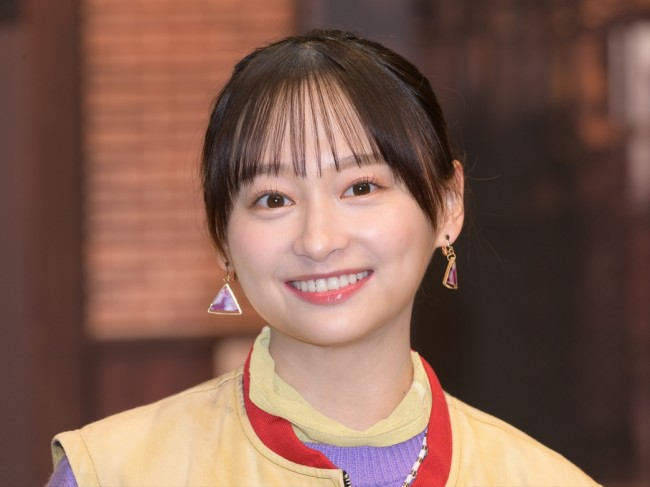
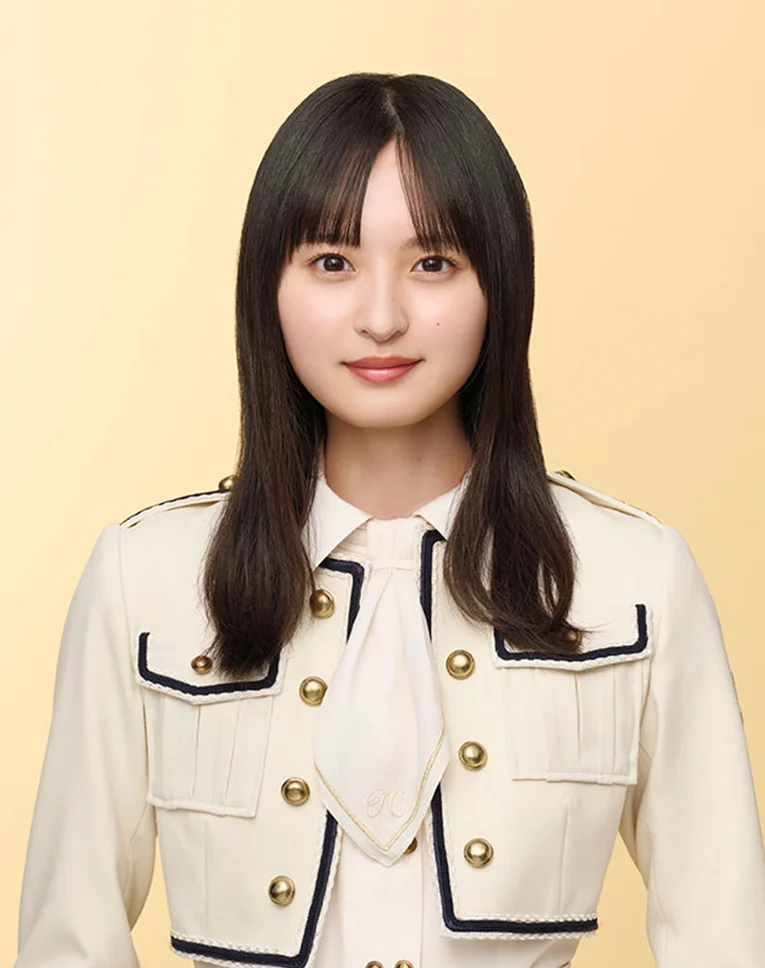

{'verified': True, 'distance': 0.5480577764024994, 'threshold': 0.593, 'model': 'SFace', 'detector_backend': 'retinaface', 'similarity_metric': 'cosine', 'facial_areas': {'img1': {'x': 225, 'y': 93, 'w': 203, 'h': 252, 'left_eye': (364, 187), 'right_eye': (269, 198)}, 'img2': {'x': 274, 'y': 148, 'w': 215, 'h': 278, 'left_eye': (432, 265), 'right_eye': (330, 264)}}, 'time': 1.74}


In [16]:
img1_path = random.choice(list(Path("./sample_face/").glob("**/*.*")))
img2_path = random.choice(list(Path("./sample_face/").glob("**/*.*")))

display_images_grid_html(
    images=[cv2.imread(str(img1_path))[:,:,::-1], cv2.imread(str(img2_path))[:,:,::-1]],
    labels=[img1_path.name, img2_path.name],
)

model_list = ["VGG-Face", "Facenet", "Facenet512", "OpenFace", "DeepFace", "DeepID", "ArcFace", "Dlib", "SFace","GhostFaceNet"]
detector_backend_list = ['opencv', 'retinaface', 'mtcnn', 'ssd', 'dlib', 'mediapipe', 'yolov8', 'centerface', 'skip']
distance_metric_list = ['cosine', 'euclidean', 'euclidean_l2']

result = DeepFace.verify(
    img1_path = str(img1_path),
    img2_path = str(img2_path),
    model_name = "SFace",
    detector_backend="retinaface",
    distance_metric = "cosine"
)
print(result)

2.jpg,bbox,|,3.jpeg,bbox

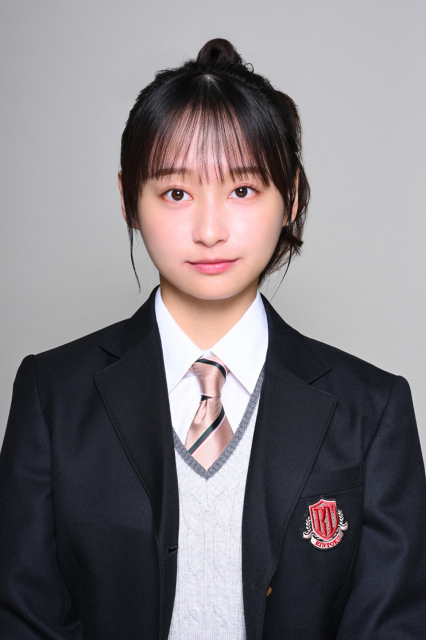
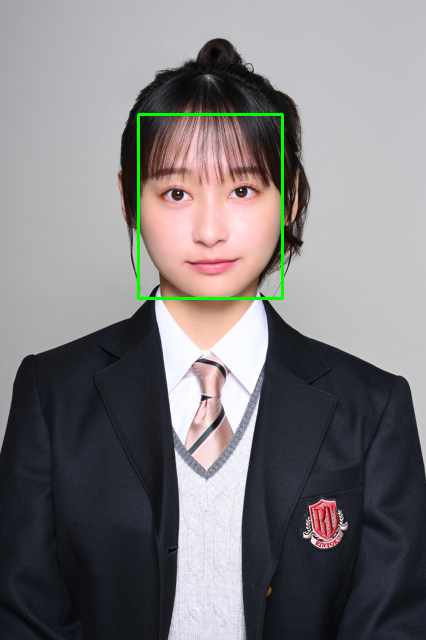
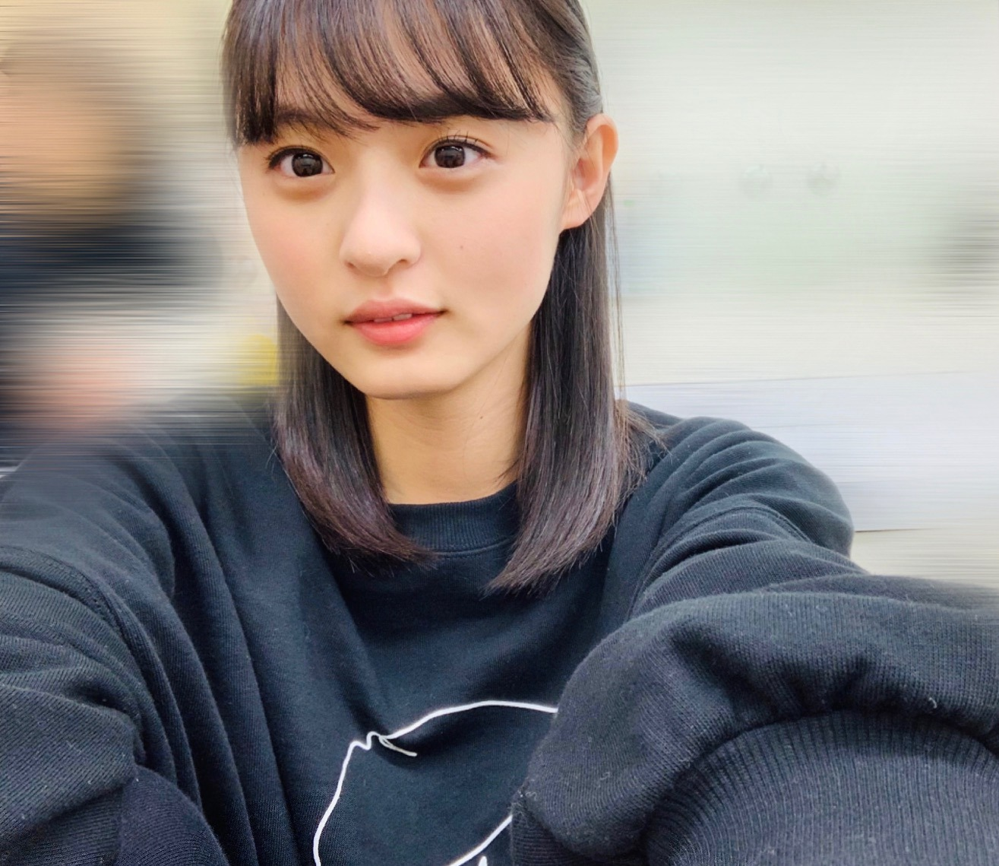
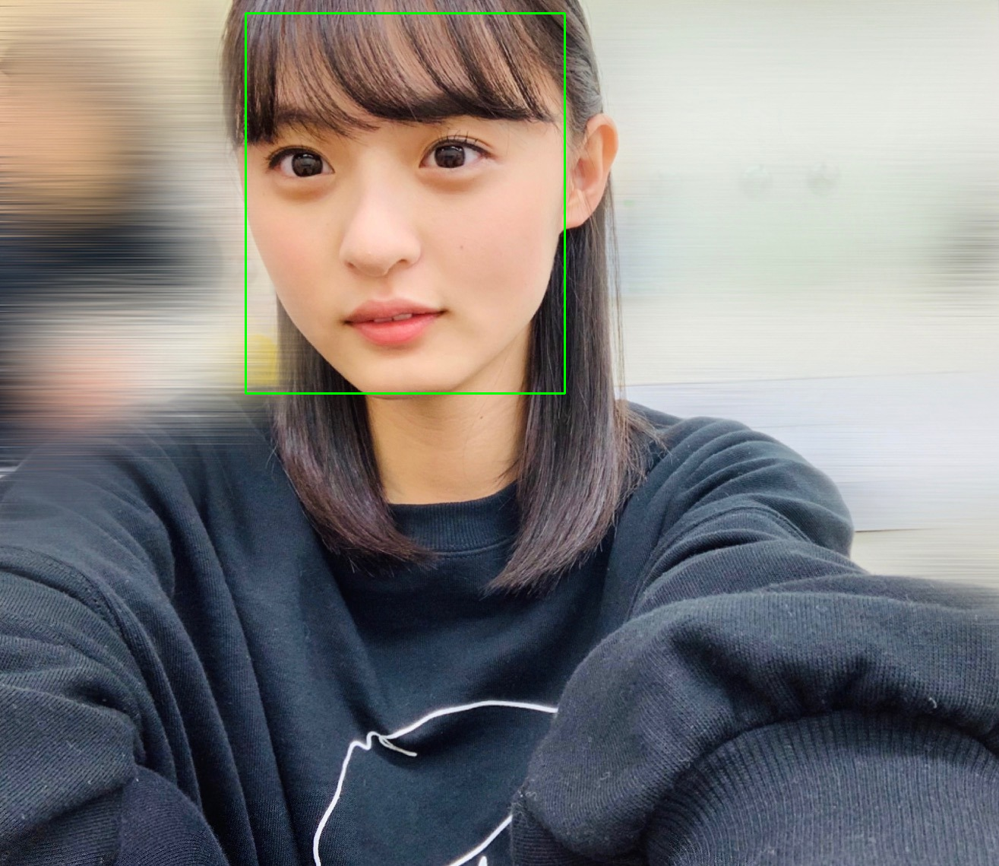

2.jpg,rot,|,3.jpeg,rot

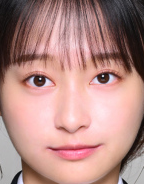
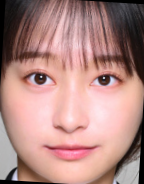
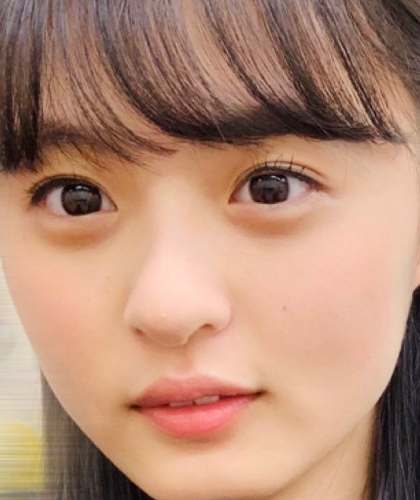
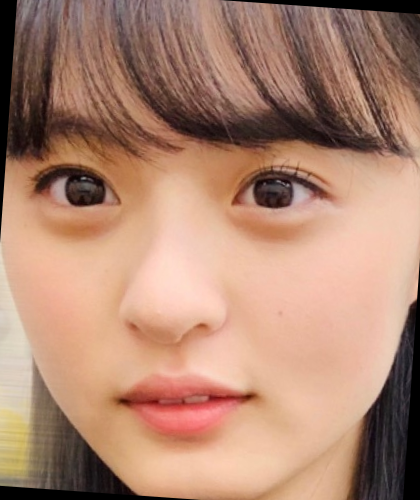

{'verified': False, 'distance': 0.44048633120571046, 'threshold': 0.3, 'model': 'Facenet512', 'detector_backend': 'yolov8', 'similarity_metric': 'cosine', 'facial_areas': {'img1': {'x': 138, 'y': 114, 'w': 144, 'h': 184, 'left_eye': (241, 194), 'right_eye': (177, 198)}, 'img2': {'x': 323, 'y': 17, 'w': 420, 'h': 500, 'left_eye': (591, 211), 'right_eye': (406, 224)}}, 'time': 0.82}


In [25]:
# 結果の詳細を表示
img1_path = random.choice(list(Path("./sample_face/").glob("**/*.*")))
img2_path = random.choice(list(Path("./sample_face/").glob("**/*.*")))
result = DeepFace.verify(
    img1_path = img1_path,
    img2_path = img2_path,
    model_name = "Facenet512",
    detector_backend="yolov8",
    distance_metric = "cosine"
)

# 顔の特徴量を取得
img1_face = result["facial_areas"]["img1"]
img2_face = result["facial_areas"]["img2"]

# 顔の特徴量を表示
img1 = cv2.imread(str(img1_path))[:,:,::-1].copy()
img2 = cv2.imread(str(img2_path))[:,:,::-1].copy()

# 顔にBBoxを表示
img1_draw_bbox = cv2.rectangle(img1.copy(), (img1_face["x"], img1_face["y"]), (img1_face["x"]+img1_face["w"], img1_face["y"]+img1_face["h"]), (0, 255, 0), 2)
img2_draw_bbox = cv2.rectangle(img2.copy(), (img2_face["x"], img2_face["y"]), (img2_face["x"]+img2_face["w"], img2_face["y"]+img2_face["h"]), (0, 255, 0), 2)

# 顔をクリッピング
img1_crop = img1[img1_face["y"]:img1_face["y"]+img1_face["h"], img1_face["x"]:img1_face["x"]+img1_face["w"]]
img2_crop = img2[img2_face["y"]:img2_face["y"]+img2_face["h"], img2_face["x"]:img2_face["x"]+img2_face["w"]]

def rotate_img(img, left_eye, right_eye):
    angle = np.degrees(np.arctan2(right_eye[1] - left_eye[1], right_eye[0] - left_eye[0]))
    if angle > 90: angle -= 180
    elif angle < -90: angle += 180
    center = (img.shape[1] // 2, img.shape[0] // 2)
    M = cv2.getRotationMatrix2D(center, angle, 1)
    return cv2.warpAffine(img, M, (img.shape[1], img.shape[0]))

img1_crop_rot = rotate_img(img1_crop, img1_face["left_eye"], img1_face["right_eye"])
img2_crop_rot = rotate_img(img2_crop, img2_face["left_eye"], img2_face["right_eye"])


display_images_grid_html(
    images=[img1, img1_draw_bbox, None, img2, img2_draw_bbox],
    labels=[img1_path.name, "bbox", "|", img2_path.name, "bbox"],
    cols=5
)

display_images_grid_html(
    images=[img1_crop, img1_crop_rot, None, img2_crop, img2_crop_rot],
    labels=[img1_path.name, "rot", "|", img2_path.name, "rot"],
    cols=5
)

print(result)


## ベンチマーク測定

"元画像 (698, 700)","リサイズ後 (698, 700)"

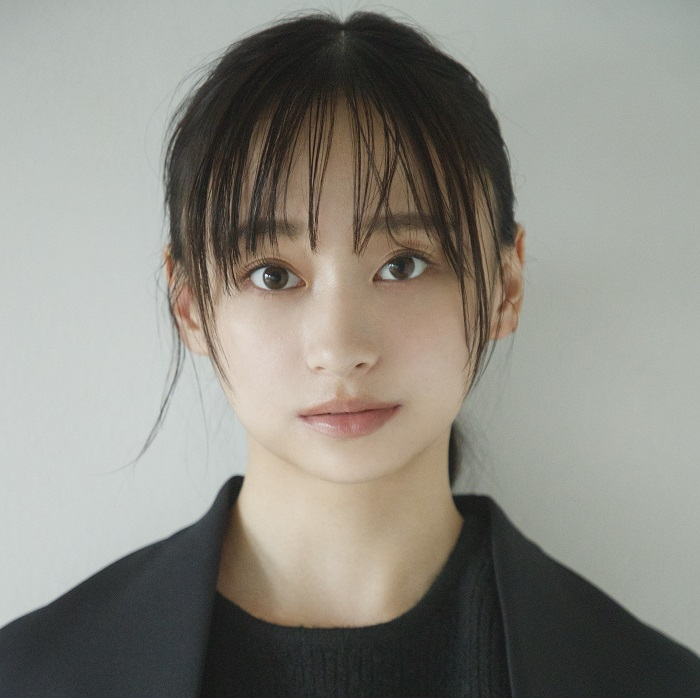
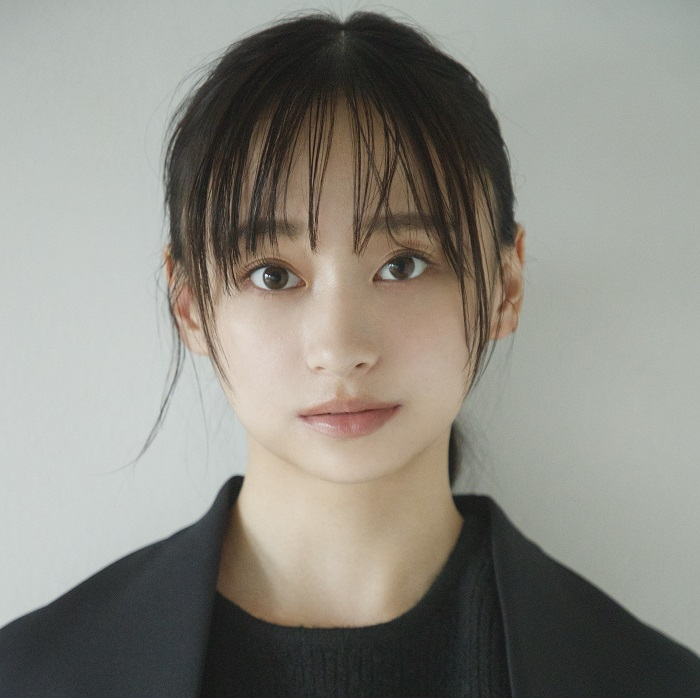

100%|██████████| 10/10 [00:06<00:00,  1.62it/s]

10回の検索にかかった時間: 6.181 秒
1回あたりの平均時間: 0.61813090 秒
正解数: 10 / 10


In [9]:
import time
import cv2
import os
import random
import numpy as np
from pathlib import Path
from tqdm import tqdm
from deepface import DeepFace
from contextlib import redirect_stdout

from display_notebook import display_images_grid_html

test_num = 10
image_path = Path("./sample_face/kageyama_yuka/4.jpg")
org_image = cv2.imread(str(image_path))[:,:,::-1].copy()

# リサイズする
raito = 1
image = cv2.resize(org_image, dsize=None, fx=raito, fy=raito)

display_images_grid_html(images=[org_image, image], labels=[f"元画像 {org_image.shape[:2]}", f"リサイズ後 {image.shape[:2]}"])

model_list = ["VGG-Face", "Facenet", "Facenet512", "OpenFace", "DeepFace", "DeepID", "ArcFace", "Dlib", "SFace","GhostFaceNet"]
detector_backend_list = ['opencv', 'retinaface', 'mtcnn', 'ssd', 'dlib', 'mediapipe', 'yolov8', 'centerface', 'skip']
distance_metric_list = ['cosine', 'euclidean', 'euclidean_l2']

start = time.time()
verified_count = 0
for img_path in tqdm(range(test_num)):
    result = DeepFace.verify(
        img1_path = str(image_path),
        img2_path = str(image_path),
        model_name = "Facenet512",  # "VGG-Face", "Facenet", "Facenet512", "OpenFace", "DeepFace", "DeepID", "ArcFace", "Dlib", "SFace","GhostFaceNet"
        detector_backend="yolov8",  # 'opencv', 'retinaface', 'mtcnn', 'ssd', 'dlib', 'mediapipe', 'yolov8', 'centerface', 'skip'
        distance_metric = "cosine"  # 'cosine', 'euclidean', 'euclidean_l2'
    )
    verified_count += 1 if result["verified"] else 0
end = time.time()

print(f"{test_num}回の検索にかかった時間: {end - start:.3f} 秒")
print(f"1回あたりの平均時間: {((end - start) / test_num):.8f} 秒")
print(f"正解数: {verified_count} / {test_num}")

